# 0.0. IMPORTS

In [145]:
import os
import pickle
import random
import pandas as pd
import numpy as np
import requests

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from IPython.display import Image
from scipy import stats as ss

import psycopg2
from sqlalchemy import create_engine

import xgboost as xgb
import scikitplot as skplt
import sklearn.metrics as m
from sklearn import preprocessing as pp
from sklearn import ensemble as en
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from category_encoders import TargetEncoder
from category_encoders.one_hot import OneHotEncoder
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

In [144]:
os.environ['PA004_host'] = 'comunidade-ds-postgres.c50pcakiuwi3.us-east-1.rds.amazonaws.com'
os.environ['PA004_username'] = 'member'
os.environ['PA004_password'] = 'cdspa'
os.environ['PA004_database'] = 'comunidadedsdb'
os.environ['PA004_port'] = '5432'

## 0.1. Helper Functions

In [261]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [24, 12]
    plt.rcParams['font.size'] = 40
       
    sns.set()
jupyter_settings()

def fig_title(fig, title):
    fig.update_layout(
            title={
            'text' : title,
            'x':0.5,
            'xanchor': 'center'
        })
    return fig

def cramer_v(x, y):
    cm = pd.crosstab(x, y).values

    chi2 = ss.chi2_contingency(cm)[0]    
    n = cm.sum()
    r, k = cm.shape
    
    # bias correction
    chi2cor = max(0, chi2 - ((k-1) * (r-1)) / (n-1))
    kcor = k - ((k-1)**2) / (n-1)
    rcor = r - ((r-1)**2) / (n-1)
    
    return np.sqrt((chi2cor/n)  / (min(kcor-1,rcor-1)))


def score_preparation(data, yhat):
    
    data_score = data.copy()
    
    # score
    try: # multiple values 
        data_score['score'] =  [y[1] for y in yhat]
    except:
        data_score['score'] = yhat
    # sort clients
    data_score = data_score.sort_values('score', ascending=False)

    # creating a result dataframe
    result_df = data_score[['response', 'score']].reset_index(drop=True)
    result_df['position'] = result_df.index + 1
    
    return result_df



def roc_auc_full(data, yhat):
    metric_df = score_preparation(data, yhat)
    
    return m.roc_auc_score(metric_df['response'], metric_df['score'])

def recall_at_k(data, yhat, k='default'):
    
    metric_df = score_preparation(data, yhat)
    
    # recall at k 
    metric_df['recall_at_k'] = metric_df['response'].cumsum() / metric_df['response'].sum()
    
    if k == 'default':
        list_of_k = [0.1, 0.2, 0.3, 0.4]
        list_of_k = [int(element*len(metric_df)) for element in list_of_k]
    else:
        list_of_k = [k]
    
    return metric_df.loc[metric_df['position'].isin(list_of_k), 'recall_at_k'].sum()


def ml_score_at_k(model_name, data, yhat, k='default'):
    df_score = pd.DataFrame({'model_name': model_name,
                             'k': k,
                             'recall_at_k': round(recall_at_k(data, yhat, k),4), 
                             'full_roc_auc': round(roc_auc_full(data, yhat),4)}, index=[0])
  
    return df_score


def k_fold_test(model_name, model, df_train_full, k_number=5):
    
    df_train_full = df_train_full.reset_index(drop=True)
      
    k_x = df_train_full.drop(columns=['response']).values
    k_y = df_train_full['response'].values

    results_of_k = pd.DataFrame()
    
    kfold = StratifiedKFold(n_splits=k_number, shuffle=True, random_state=99)
    
    for train_ix, test_ix in kfold.split(k_x, k_y):
        # SPLIT TEST
        train_y, test_y = k_y[train_ix], k_y[test_ix]

        # SPLIT X, PREPARATION AND FEATURE SELECTION
        
        train_X = df_train_full.loc[train_ix].copy()
        my_data_preparation = DataPrepatarion(train_X)
        
        columns_selected = ['vintage', 'annual_premium', 'age', 
                    'region_code', 'policy_sales_channel', 
                    'vehicle_damage', 'previously_insured']
        
        # returning the data after preparation
        train_X = my_data_preparation.get_train_data()[columns_selected]
        
        test_X = df_train_full.loc[test_ix].copy()
        test_X = my_data_preparation.get_transformed_data(test_X)[columns_selected]
          
        # training
        model.fit(train_X, train_y)

        # predict
        yhat = model.predict_proba(test_X)
        
        # df_train_full for metrics
        df_for_metrics = df_train_full.loc[test_ix].copy()

        # metrics
        k_score = ml_score_at_k(model_name, df_for_metrics, yhat)
        results_of_k = pd.concat([results_of_k, k_score])
    
    # k_fold metrics
    return_metrics = pd.DataFrame({'MODEL_NAME': results_of_k.iloc[0, 0],
                  'at_K':results_of_k.iloc[0, 1],
                  'RECALL_MEAN':results_of_k['recall_at_k'].mean(),
                  'RECALL_STD':results_of_k['recall_at_k'].std(),
                  'FULL_ROC_AUC_MEAN':results_of_k['full_roc_auc'].mean(),
                  'FULL_ROC_AUC_STD':results_of_k['full_roc_auc'].std()}, index=[0])

    return return_metrics

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## 0.2. Loading Data

In [147]:
host = os.environ['PA004_host']
username = os.environ['PA004_username']
password = os.environ['PA004_password']
database = os.environ['PA004_database']
port = os.environ['PA004_port']

conn = psycopg2.connect(host=host, 
                 port=port, 
                 user=username, 
                 password=password, 
                 database=database, 
                 options="-c search_path=pa004,public")

query = """
    select
        *
    from 
        users u 
    left join insurance i 
        on u.id = i.id 
    left join vehicle v
        on u.id = v.id 
"""

data_raw = pd.read_sql_query(query, conn)

# just removing duplicated id columns
data_raw = data_raw.loc[:,~data_raw.columns.duplicated()]

conn.close()

# 1.0. PASSO 01 - DATA DESCRIPTION

In [148]:
df1 = data_raw.copy()
df1.head()

,id,gender,age,region_code,policy_sales_channel,previously_insured,annual_premium,vintage,response,driving_license,vehicle_age,vehicle_damage
0,7,Male,23,11.0,152.0,0,23367.0,249,0,1,< 1 Year,Yes
1,13,Female,41,15.0,14.0,1,31409.0,221,0,1,1-2 Year,No
2,18,Female,25,35.0,152.0,1,46622.0,299,0,1,< 1 Year,No
3,31,Female,26,8.0,160.0,0,2630.0,136,0,1,< 1 Year,No
4,39,Male,45,8.0,124.0,0,42297.0,264,0,1,1-2 Year,Yes


## 1.1. Data Dimensions

In [149]:
print(f'Number of Rows: {df1.shape[0]}')
print(f'Number of Columns: {df1.shape[1]}')

Number of Rows: 381109
Number of Columns: 12


## 1.2. Rename Columns

In [150]:
df1.columns = df1.columns.to_series().str.lower()

## 1.3. Data Types

In [151]:
df1.dtypes

id                        int64
gender                   object
age                       int64
region_code             float64
policy_sales_channel    float64
previously_insured        int64
annual_premium          float64
vintage                   int64
response                  int64
driving_license           int64
vehicle_age              object
vehicle_damage           object
dtype: object

## 1.4. Check NA

In [152]:
df1.isna().sum()

id                      0
gender                  0
age                     0
region_code             0
policy_sales_channel    0
previously_insured      0
annual_premium          0
vintage                 0
response                0
driving_license         0
vehicle_age             0
vehicle_damage          0
dtype: int64

## 1.5. Descriptive Statistics

In [153]:
num_attributes = df1.select_dtypes(include=['int64', 'float64'])#.drop(columns=['id'])
cat_attributes = df1.select_dtypes(exclude=['int64', 'float64'])

### 1.5.1. Numerical Attributes

In [154]:
descriptive_num = num_attributes.describe().transpose()
descriptive_num['range'] = descriptive_num['max'] - descriptive_num['min']
descriptive_num['skew'] = num_attributes.skew()
descriptive_num['kurtosis'] = num_attributes.kurtosis()

descriptive_num = descriptive_num.rename(columns = {'50%':'median'})

descriptive_num = descriptive_num[['min', 'max','range','mean','median','std', 'skew', 'kurtosis']]
descriptive_num

,min,max,range,mean,median,std,skew,kurtosis
id,1.0,381109.0,381108.0,190555.000000,190555.0,110016.836208,-8.071174e-18,-1.200000
age,20.0,85.0,65.0,38.822584,36.0,15.511611,6.725390e-01,-0.565655
region_code,0.0,52.0,52.0,26.388807,28.0,13.229888,-1.152664e-01,-0.867857
policy_sales_channel,1.0,163.0,162.0,112.034295,133.0,54.203995,-9.000081e-01,-0.970810
previously_insured,0.0,1.0,1.0,0.458210,0.0,0.498251,1.677471e-01,-1.971871
annual_premium,2630.0,540165.0,537535.0,30564.389581,31669.0,17213.155057,1.766087e+00,34.004569
vintage,10.0,299.0,289.0,154.347397,154.0,83.671304,3.029517e-03,-1.200688
response,0.0,1.0,1.0,0.122563,0.0,0.327936,2.301906e+00,3.298788
driving_license,0.0,1.0,1.0,0.997869,1.0,0.046110,-2.159518e+01,464.354302


### 1.5.2. Categorical Attributes

In [155]:
cat_attributes.head()

,gender,vehicle_age,vehicle_damage
0,Male,< 1 Year,Yes
1,Female,1-2 Year,No
2,Female,< 1 Year,No
3,Female,< 1 Year,No
4,Male,1-2 Year,Yes


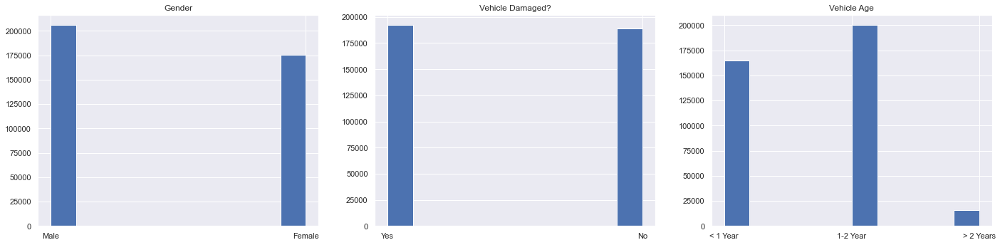

In [156]:
grid = GridSpec(2,3)
# gender and vehicle_damage --> can see as a "numerical" variable
plt.subplot(grid[0,0])
cat_attributes['gender'].hist().set_title('Gender')

plt.subplot(grid[0,1])
cat_attributes['vehicle_damage'].hist().set_title('Vehicle Damaged?')

plt.subplot(grid[0,2])
cat_attributes['vehicle_age'].hist().set_title('Vehicle Age');

# 2.0. PASSO 02 - FEATURE ENGINEERING

In [157]:
df2 = df1.copy()

## 2.1. Mapa Mental de Hipoteses

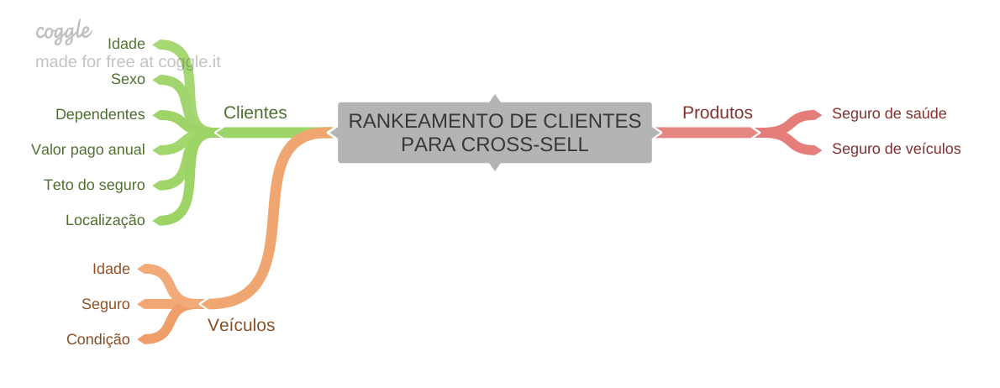

In [158]:
Image('../imgs/RANKEAMENTO_DE_CLIENTES_PARA_CROSS-SELL.png')

## 2.2. Criacao das Hipoteses

### 2.1.1. Hipoteses Usuários

1. Usuários que são clientes a mais tempo respondem mais que querem o seguro
2. Usuários que já tem seguro de carro, são os que menos querem o novo produto
3. Usuários mais velhos são os que mais querem o seguro
4. Usuários que pagam mais no seguro de saúde são os que mais querem o seguro
5. Usuários da nossa região mais populosa são os que mais querem o seguro.

### 2.1.2. Hipoteses Veículos

1. Usuários com veículos mais antigo são os que menos querem o seguro
2. Usuários com com veículos que já foram danificados, são os que mais querem o seguro

## 2.3. Lista final de hipoteses

1. Usuários que são clientes a mais tempo respondem são os que mais querem o seguro
2. Usuários que já tem seguro de carro, são os que menos querem o novo produto
3. Usuários mais velhos são os que mais querem o seguro
4. Usuários que pagam mais no seguro de saúde são os que mais querem o seguro
5. Usuários que moram em localizações em que temos maior número de usuários são os que mais querem o seguro.
6. Usuários com veículos mais antigo são os que menos querem o seguro
7. Usuários com com veículos que já foram danificados, são os que mais querem o seguro

## 2.4. Feature Engineering

In [159]:
# changing vehicle_damage --> 1 == yes //// 0 == no
df2['vehicle_damage'] = df2['vehicle_damage'].apply(lambda x: 1 if x == 'Yes' else 0)

# vehicle_age
df2['vehicle_age'] = df2['vehicle_age'].apply(lambda x: 'over_2_years' if x == '> 2 Years' 
                                              else '1_to_2_years' if x == '1-2 Year' 
                                              else 'under_1_year')

# 3.0. PASSO 03 - FILTRAGEM DE VARIAVEIS

In [160]:
df3 = df2.copy()

## 3.1. Filtragem das Linhas

## 3.2. Filtragem das Colunas

# 4.0. PASSO 04 - ANALISE EXPLORATORIA DOS DADOS

In [334]:
df4 = df3.copy()

pickle.dump(df4, open('../datasets/intermediary_data_df4.pkl', 'wb'))

## 4.1. Analise Univariada

### 4.1.1. Response Variable

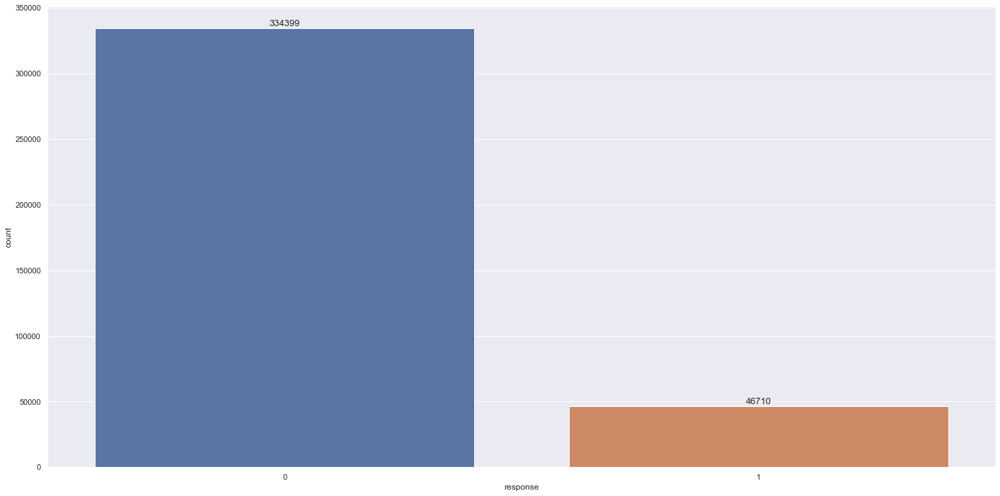

In [162]:
aux = df4[['response', 'id']].groupby('response').count().reset_index()
aux = aux.rename(columns={'id':'count'})

ax = sns.barplot(x='response', y='count', data=aux)
ax.bar_label(ax.containers[0], label_type='edge', fontsize=13);

### 4.1.2. Numerical Variable

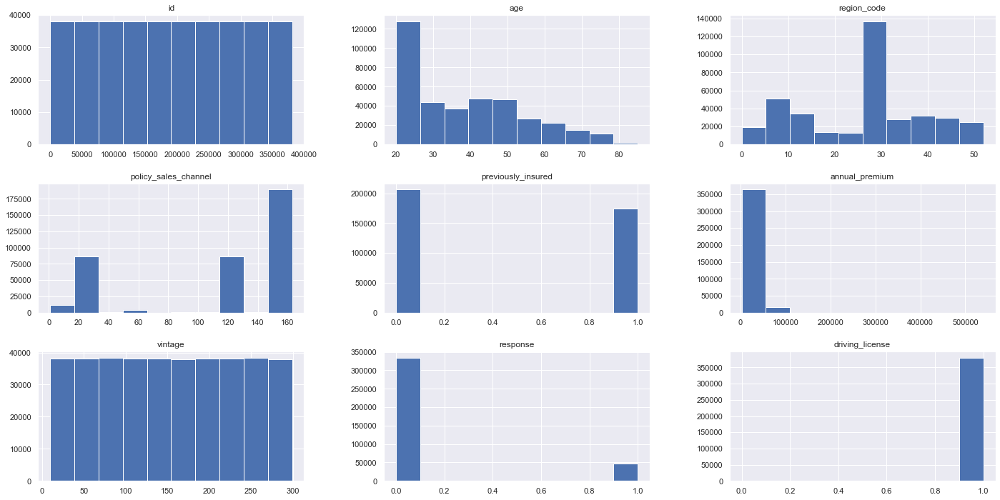

In [163]:
num_attributes.hist();

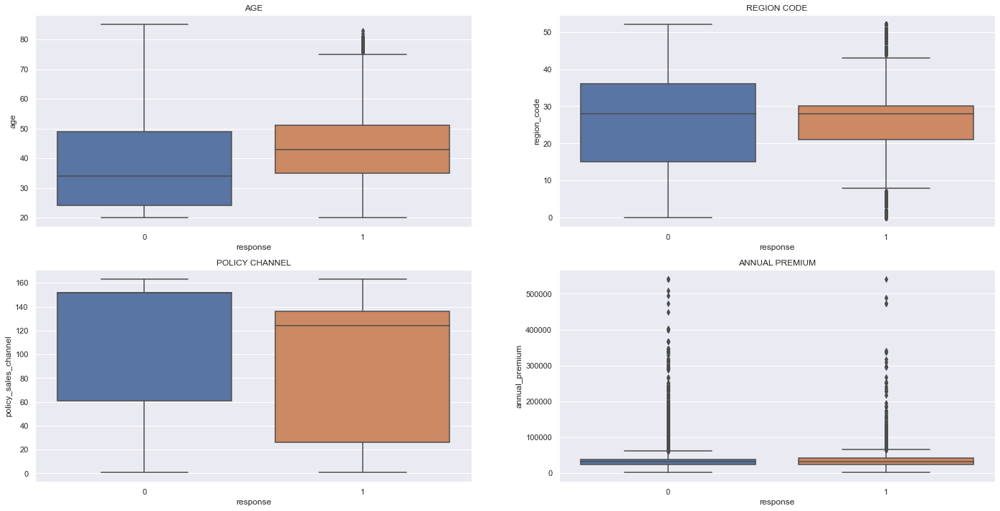

In [164]:
# age
grid = GridSpec(2,2)

plt.subplot(grid[0,0])
sns.boxplot(x='response', y='age',data=num_attributes).set_title('AGE')

plt.subplot(grid[0,1])
sns.boxplot(x='response', y='region_code',data=num_attributes).set_title('REGION CODE')

plt.subplot(grid[1,0])
sns.boxplot(x='response', y='policy_sales_channel',data=num_attributes).set_title('POLICY CHANNEL')

plt.subplot(grid[1,1])
sns.boxplot(x='response', y='annual_premium',data=num_attributes).set_title('ANNUAL PREMIUM');


### 4.1.3. Categorical Variable

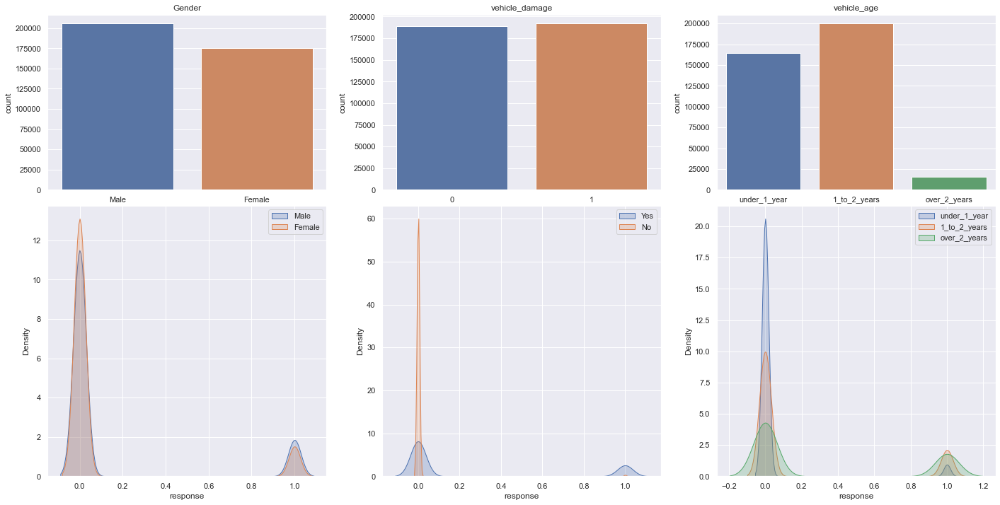

In [165]:
aux = df4.copy()

grid = GridSpec(5,3)


plt.subplot(grid[:2,0])
sns.countplot(x=df4['gender']).set_title('Gender')

plt.subplot(grid[2:,0])
ax = sns.kdeplot(x=aux[aux['gender'] == 'Male']['response'],shade=True) # shade=more transparent
sns.kdeplot(x=aux[aux['gender'] == 'Female']['response'], shade=True, ax=ax)
ax.legend(labels=['Male', 'Female'])

plt.subplot(grid[:2,1])
sns.countplot(x=df4['vehicle_damage']).set_title('vehicle_damage')

plt.subplot(grid[2:,1])
ax2 = sns.kdeplot(x=aux[aux['vehicle_damage'] == 1]['response'],shade=True) # shade=more transparent
sns.kdeplot(x=aux[aux['vehicle_damage'] == 0]['response'],shade=True, ax=ax2)
ax2.legend(labels=['Yes', 'No'])

plt.subplot(grid[:2,2])
sns.countplot(x=df4['vehicle_age']).set_title('vehicle_age')

plt.subplot(grid[2:,2])
ax3 = sns.kdeplot(x=aux[aux['vehicle_age'] == 'under_1_year']['response'],shade=True) # shade=more transparent
sns.kdeplot(x=aux[aux['vehicle_age'] == '1_to_2_years']['response'],shade=True, ax=ax3)
sns.kdeplot(x=aux[aux['vehicle_age'] == 'over_2_years']['response'],shade=True, ax=ax3)
ax3.legend(labels=['under_1_year', '1_to_2_years', 'over_2_years']);

## 4.2. Analise Bivariada

### H1. Usuários que são clientes a mais tempo respondem são os que mais querem o seguro
<b><font color='red'>FALSO</font> - A resposta aparentemente independe do tempo que o usuário é cliente

In [339]:
aux = df4[['vintage', 'response', 'id']].groupby(['vintage', 'response']).count().reset_index()
aux = aux.rename(columns={'id':'count'})

aux['title'] = 'COUNT'

aux2 = aux.copy()
aux2['count'] = aux2.apply(lambda x: round(x['count'] / 
                              aux2.loc[aux2['vintage'] == x['vintage'], 'count'].sum(), 3), 
                              axis=1)
aux2['title'] = 'COUNT RATE'


aux3 = pd.concat([aux, aux2])


fig = px.bar(aux3, x='vintage', y='count', 
             color='response',facet_col='title')  
            # category_orders={"vehicle_age": ['< 1 Year', '1-2 Year', '> 2 Years']})

fig = fig_title(fig, 'REGION CODE BY RESPONSE')
fig.update_yaxes(matches=None)

fig.show()

### H2. Usuários que já tem seguro de carro, são os que menos querem o novo produto
<b><font color='green'>VERDADEIRO</font> - Praticamente todos os clientes que já tem seguro de carro, respondem não querer o novo produto

In [167]:
aux = df4[['previously_insured', 'response', 'id']].groupby(['previously_insured', 'response']).count().reset_index()
aux['previously_insured'] = aux['previously_insured'].apply(lambda x: 'Yes' if x == 1 else 'No')
aux = aux.rename(columns={'id':'count'})


fig = px.bar(aux, x="previously_insured", y='count', color='response', text='count')
fig.show()

### H3. Usuários mais velhos são os que mais querem o seguro
<b><font color='green'>VERDADEIRO</font> - Os clientes na faixa dos 30 - 60 são os que mais estão interessados no seguro

In [168]:
fig = px.histogram(df4, x="age", color="response")
fig.show()

### H4. Usuários que pagam mais no seguro de saúde são os que mais querem o seguro
<b><font color='green'>VERDADEIRO</font> - Há uma leve tendência de interesse maior para os usuários que gastam mais (dentro de intervalos mais relevantes)

In [169]:
# creating intervals
aux = df4.copy()
aux['intervals'] = np.nan
val = 0 
list_intervals = []

while val < aux['annual_premium'].max():
    step = 3000
    interval = range(val, val+step)
    text_interval = f'[{val}, {val+step})'
    list_intervals.append(text_interval)
    
    aux.loc[aux['annual_premium'].isin(interval),'intervals'] = text_interval
    val += step

In [170]:
# groupby
aux2 = aux[['intervals', 'response', 'id']].groupby(['response', 'intervals']).count().reset_index()
aux2 = aux2.rename(columns={'id':'count'})
aux2['title'] = 'COUNT'

# removing bars with count < 10
aux2['count_with_response'] = aux2.apply(lambda x: aux2.loc[aux2['intervals'] == x['intervals'], 'count'].sum(), 
                              axis=1)
aux2 = aux2[aux2['count_with_response'] >= 10]


# count_rate
aux3 = aux2.copy()
aux3['count'] = aux3.apply(lambda x: round(x['count'] / 
                              aux3.loc[aux3['intervals'] == x['intervals'], 'count'].sum(), 2), 
                              axis=1)
aux3['title'] = 'COUNT RATE'

# both data plots
aux4 = pd.concat([aux2, aux3])


# plot count
fig = px.bar(aux4, x='intervals', y='count', 
             color='response',facet_row='title',text='count',  
             category_orders={"intervals": list_intervals})



fig = fig_title(fig, 'ANNUAL PREMIUM BY RESPONSE')
fig.update_traces(textposition='auto', textfont_size=9)
fig.update_yaxes(matches=None)
fig.show()

In [171]:
# groupby
aux2 = aux[['intervals', 'response', 'id']].groupby(['response', 'intervals']).count().reset_index()
aux2 = aux2.rename(columns={'id':'count'})

# count_rate
aux2['count_rate'] = aux2.apply(lambda x: round(x['count'] / 
                              aux2.loc[aux2['intervals'] == x['intervals'], 'count'].sum(), 2), 
                              axis=1)

# removing bars with count < 10
aux2['count_with_response'] = aux2.apply(lambda x:  aux2.loc[aux2['intervals'] == x['intervals'], 'count'].sum(), 
                              axis=1)
aux2 = aux2[aux2['count_with_response'] >= 10]

# plot count
fig = px.bar(aux2, x='intervals', y='count', 
             color='response',  
             category_orders={"intervals": list_intervals})

fig = fig_title(fig, 'COUNT')
fig.show()


# plot count rate
fig2 = px.bar(aux2, x='intervals', y='count_rate', 
             color='response', text='count_rate',  
             category_orders={"intervals": list_intervals})

fig2 = fig_title(fig2, 'COUNT RATE')
fig2.show()

### H5. Usuários da nossa região mais populosa são os que mais querem o seguro.
<b><font color='green'>VERDADEIRO</font> - A região mais populosa têm o segundo maior interesse % no seguro

In [172]:
aux = df4[['region_code', 'response', 'id']].groupby(['region_code', 'response']).count().reset_index()
aux = aux.rename(columns={'id':'count'})

aux['title'] = 'COUNT'

aux2 = aux.copy()
aux2['count'] = aux2.apply(lambda x: round(x['count'] / 
                              aux2.loc[aux2['region_code'] == x['region_code'], 'count'].sum(), 3), 
                              axis=1)
aux2['title'] = 'COUNT RATE'


aux3 = pd.concat([aux, aux2])


fig = px.bar(aux3, x='region_code', y='count', 
             color='response', text='count',facet_col='title')  
            # category_orders={"vehicle_age": ['< 1 Year', '1-2 Year', '> 2 Years']})

fig = fig_title(fig, 'REGION CODE BY RESPONSE')
fig.update_yaxes(matches=None)

fig.show()

### H6. Usuários com veículos mais antigo são os que menos querem o seguro
<b><font color='red'>FALSO</font> - Quanto mais antigo o carro maior o interesse do usuário no seguro

In [173]:
aux = df4[['vehicle_age', 'response', 'id']].groupby(['vehicle_age', 'response']).count().reset_index()
aux = aux.rename(columns={'id':'count'})

aux['title'] = 'COUNT'

aux2 = aux.copy()
aux2['count'] = aux2.apply(lambda x: round(x['count'] / 
                              aux2.loc[aux2['vehicle_age'] == x['vehicle_age'], 'count'].sum(), 3), 
                              axis=1)
aux2['title'] = 'COUNT RATE'


aux3 = pd.concat([aux, aux2])


fig = px.bar(aux3, x='vehicle_age', y='count', 
             color='response', text='count',facet_col='title',  
             category_orders={"vehicle_age": ['under_1_year', '1_to_2_years', 'over_2_years']})

fig = fig_title(fig, 'VEHICLE AGE BY RESPONSE')
fig.update_yaxes(matches=None)

fig.show()

### H7. Usuários com com veículos que já foram danificados, são os que mais querem o seguro
<b><font color='green'>VERDADEIRO</font> - Usuários que já tiveram seu veículo danificado são os que mais querem o seguro

In [174]:
aux = df4[['vehicle_damage', 'response', 'id']].groupby(['vehicle_damage', 'response']).count().reset_index()
aux['vehicle_damage'] = aux['vehicle_damage'].apply(lambda x: 'Yes' if x == 1 else 'No')
aux = aux.rename(columns={'id':'count'})

fig = px.bar(aux, x="vehicle_damage", y='count', color='response', text='count')
fig.show()

### 4.2.1. Resumo das Hipoteses

In [317]:
hip_name = ['H1. Usuários que são clientes a mais tempo respondem são os que mais querem o seguro',
            'H2. Usuários que já tem seguro de carro, são os que menos querem o novo produto',
            'H3. Usuários mais velhos são os que mais querem o seguro',
            'H4. Usuários que pagam mais no seguro de saúde são os que mais querem o seguro',
            'H5. Usuários da nossa região mais populosa são os que mais querem o seguro.',
            'H6. Usuários com veículos mais antigo são os que menos querem o seguro',
            'H7. Usuários com com veículos que já foram danificados, são os que mais querem o seguro']

hip_result = [False,
              True,
              True,
              True,
              True,
              False,
              True]

hip_relevance = ['Low',
                 'Low',
                 'High',
                 'High',
                 'Medium',
                 'Medium',
                 'Low']

hip_resume = pd.DataFrame({'H': hip_name, 'Result': hip_result , 'Relevance': hip_relevance})
hip_resume['H'] = hip_resume['H'].apply(lambda x: x[:2])
hip_resume

,H,Result,Relevance
0,H1,False,Low
1,H2,True,Low
2,H3,True,High
3,H4,True,High
4,H5,True,Medium
5,H6,False,Medium
6,H7,True,Low


## 4.3. Analise Multivariada

### 4.3.1. Numerical Attributes

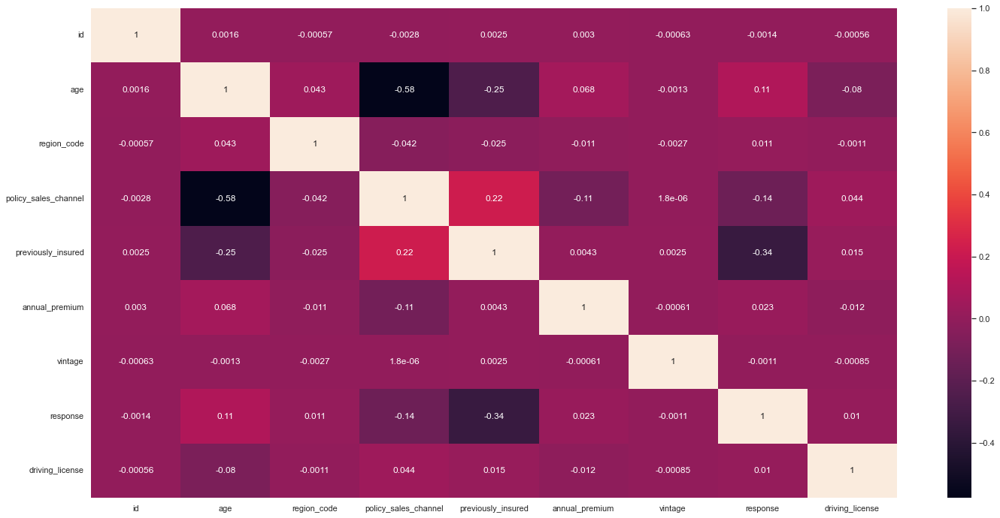

In [175]:
correlation = num_attributes.corr(method='pearson')
sns.heatmap(correlation, annot=True);

### 4.3.2. Categorical Attributes

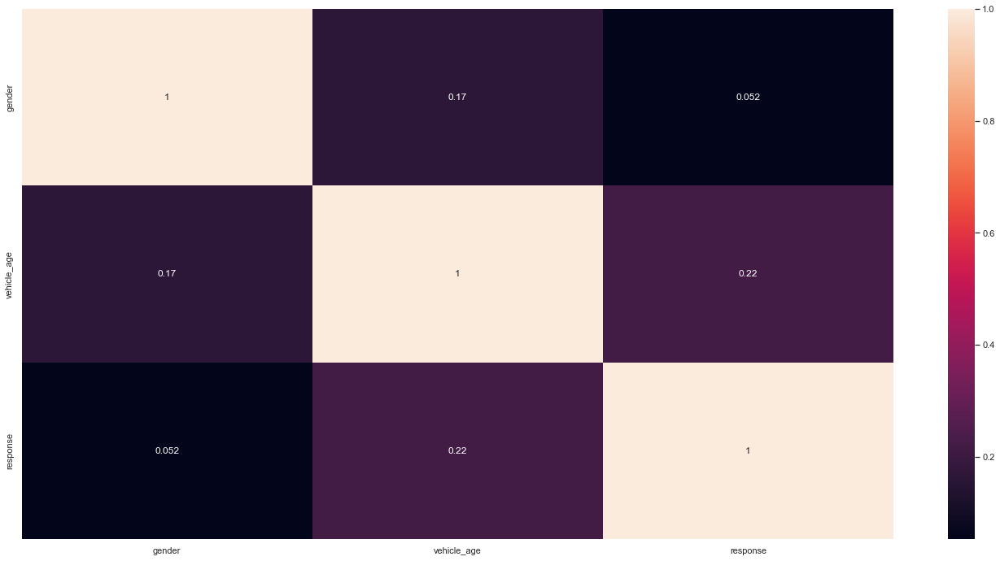

In [176]:
# categorical data

a = df4[['gender', 'vehicle_age', 'response']].copy()
a['response'] = a['response'].apply(lambda x: 'Yes' if x==1 else 'No')

# cramer v 
a1 = cramer_v( a['gender'], a['gender'])
a2 = cramer_v( a['gender'], a['vehicle_age'])
a3 = cramer_v( a['gender'], a['response'])

a4 = cramer_v( a['vehicle_age'], a['gender'])
a5 = cramer_v( a['vehicle_age'], a['vehicle_age'])
a6 = cramer_v( a['vehicle_age'], a['response'])

a7 = cramer_v( a['response'], a['gender'])
a8 = cramer_v( a['response'], a['vehicle_age'])
a9 = cramer_v( a['response'], a['response'])

# creating dataframe
d = pd.DataFrame({'gender':[a1, a2, a3],
              'vehicle_age':[a4, a5, a6],
              'response':[a7, a8, a9]})
d = d.set_index(d.columns)

# plot
sns.heatmap(d, annot=True);

# 5.0. PASSO 05 - PREPARAÇAO DOS DADOS

In [335]:
#pickle.dump(df4, open('../datasets/intermediary_data_df4.pkl', 'wb'))
df4 = pd.read_pickle('../datasets/intermediary_data_df4.pkl')

## 5.1. Split in Train and Validation

In [252]:
X = df4.drop(columns=['response'])
y = df4['response'].copy()
x_train, x_validation, y_train, y_validation = train_test_split(X, y, test_size=0.20, random_state=99)


#x_train = x_train.drop(columns=['id'])
df5 = pd.concat([x_train, y_train], axis=1)

df_for_kfold_test = df5.copy()

## 5.2 Preparation

### 5.2.1. Class

In [253]:
class DataPrepatarion:
    def __init__(self, dataframe):
        self.data = dataframe  
        self.normalization()
        self.rescaling()
        self.encoding()

        
    def normalization(self):
        pass
    
    
    def rescaling(self):
        # annual_premium
        self.rs_anual_premium = pp.RobustScaler()
        self.data['annual_premium'] = self.rs_anual_premium.fit_transform(self.data[['annual_premium']].values)
        
        # age
        self.rs_age = pp.RobustScaler()
        self.data['age'] = self.rs_age.fit_transform(self.data[['age']].values)

        # vintage
        self.minmax_vintage = pp.MinMaxScaler()
        self.data['vintage'] = self.minmax_vintage.fit_transform(self.data[['vintage']].values)
    
        
    def encoding(self):
        # gender --> Label Encoding
        self.data['gender'] = self.data['gender'].apply(lambda x: 1 if x == 'Male' 
                                                        else 0)
        
        # driving_license --> ok --> Label Encoding

        # previously_insured --> ok --> Label Encoding

        # vehicle_damage --> ok --> Label Encoding

        # region_code --> ok --> Frequency Encoding / Target Encoding
        # Target Encoding
        self.encoder_region_code = TargetEncoder()
        self.data['region_code'] = self.data['region_code'].astype(str)
        self.data['region_code'] = self.encoder_region_code.fit_transform(self.data['region_code'], self.data['response'])

        # policy_sales_channel --> ok --> Frequency Encoding / Target Encoding
        # Target Encoding
        self.encoder_policy_sales_channel = TargetEncoder()
        self.data['policy_sales_channel'] = self.data['policy_sales_channel'].astype(str)
        self.data['policy_sales_channel'] = self.encoder_policy_sales_channel.fit_transform(self.data['policy_sales_channel'], self.data['response'])

        
        # vehicle_age --> One Hot Encoding / Order Encoding / Frequency Encoding
        # One Hot Encoding

        self.encoder_vehicle_age = OneHotEncoder(use_cat_names=True)
        vehicle_age_encoded = self.encoder_vehicle_age.fit_transform(self.data['vehicle_age'])
        
        
        columns_created = self.encoder_vehicle_age.get_feature_names()
        self.data[columns_created] =  vehicle_age_encoded.values
        self.data = self.data.drop(columns=['vehicle_age', columns_created[0]])
             
    def dump_transformers(self):
        pickle.dump(self.rs_anual_premium, open('../parameters/rs_anual_premium.pkl', 'wb'))
        pickle.dump(self.rs_age, open('../parameters/rs_age.pkl', 'wb'))
        pickle.dump(self.minmax_vintage, open('../parameters/minmax_vintage.pkl', 'wb'))
        pickle.dump(self.encoder_region_code, open('../parameters/encoder_region_code.pkl', 'wb'))
        pickle.dump(self.encoder_policy_sales_channel, open('../parameters/encoder_policy_sales_channel.pkl', 'wb'))
        pickle.dump(self.encoder_vehicle_age, open('../parameters/encoder_vehicle_age.pkl', 'wb'))
        
    
    def get_train_data(self):
        return self.data
        
    
    def get_transformed_data(self, data_to_transform):
        '''PASS THE TEST OR VALIDATION DATA TO TRANSFORM'''
        # annual_premium
        data_to_transform['annual_premium'] = self.rs_anual_premium.transform(data_to_transform[['annual_premium']].values)
        
        # age
        data_to_transform['age'] = self.rs_age.transform(data_to_transform[['age']].values)

        # vintage
        data_to_transform['vintage'] = self.minmax_vintage.transform(data_to_transform[['vintage']].values)
    
        # gender
        data_to_transform['gender'] = data_to_transform['gender'].apply(lambda x: 1 if x == 'Male' 
                                                        else 0)
        # region_code
        data_to_transform['region_code'] = self.encoder_region_code.transform(data_to_transform['region_code'].astype(str))

        # policy_sales_channel 
        data_to_transform['policy_sales_channel'] = self.encoder_policy_sales_channel.transform(data_to_transform['policy_sales_channel'].astype(str))
        
        # vehicle_age -->
        vehicle_age_encoded = self.encoder_vehicle_age.transform(data_to_transform['vehicle_age'])
        columns_created = self.encoder_vehicle_age.get_feature_names()
        data_to_transform[columns_created] =  vehicle_age_encoded.values
        data_to_transform = data_to_transform.drop(columns=['vehicle_age', columns_created[0]])
        
        return data_to_transform


### 5.2.2. Train Preparation

In [254]:
my_data_preparation = DataPrepatarion(df5)

# dump parameters
my_data_preparation.dump_transformers()

# return train data
df5 = my_data_preparation.get_train_data()

### 5.2.3. Validation Preparation

In [255]:
x_validation = my_data_preparation.get_transformed_data(x_validation)

# 6.0. PASSO 06 - FEATURE SELECTION

In [256]:
df6 = df5.drop(columns=['id'])

## 6.1. Features Importance

In [218]:
# model 
forest = en.RandomForestClassifier(n_estimators=100, random_state=99)

# data preparation
x_train_fs = df6.drop(columns=['response'])
y_train_fs = y_train.values
forest.fit(x_train_fs, y_train_fs)

RandomForestClassifier(random_state=99)

,importances
vintage,0.283081
annual_premium,0.252241
age,0.150849
region_code,0.092186
policy_sales_channel,0.077367
vehicle_damage,0.074348
previously_insured,0.047918
gender,0.011999
vehicle_age_1_to_2_years,0.007276
vehicle_age_over_2_years,0.002188


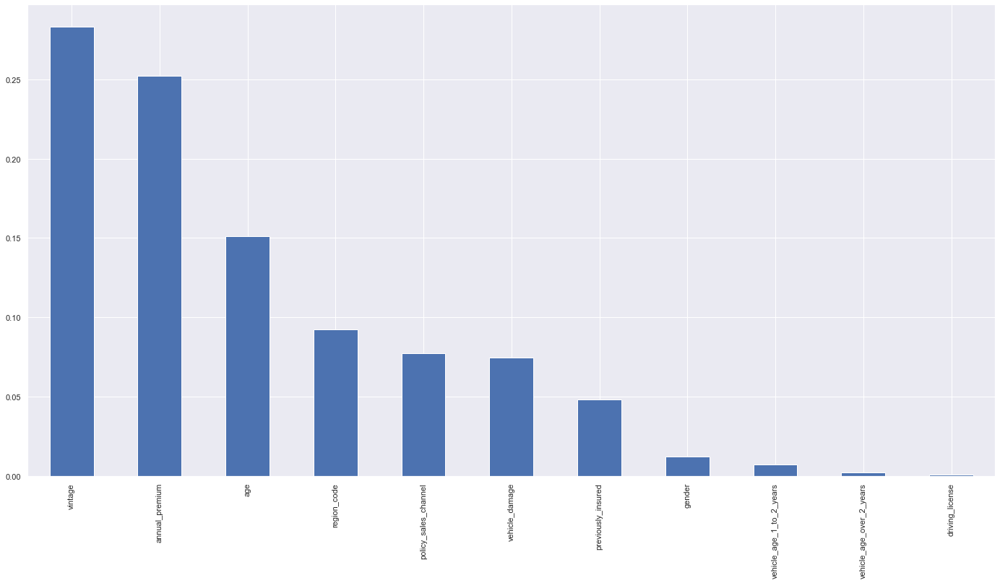

In [219]:
df_forest_importances = pd.DataFrame()
importances = forest.feature_importances_
df_forest_importances['importances'] = pd.Series(importances, index=x_train_fs.columns)
df_forest_importances = df_forest_importances.sort_values('importances', ascending=False)

display(df_forest_importances)

df_forest_importances['importances'].plot(kind='bar');

## 6.2. Feature Selection

In [295]:
columns_selected = ['vintage', 'annual_premium', 'age', 
                    'region_code', 'policy_sales_channel', 
                    'vehicle_damage', 'previously_insured']


x_train = df6[columns_selected]
x_val = x_validation[columns_selected]
y_val = y_validation.copy()

# 7.0. PASSO 07 - MACHINE LEARNING MODELLING

In [296]:
# copy data
df7 = x_validation.copy()
df7['response'] = y_validation.copy()

## 7.0.1. Metrics

### SUM of Recall at K
Recall at K é o % de interessados impactados quando selecionamos K clientes ordenados de acordo com o modelo.

Para tentar medir melhor será utilizado a soma do Recall at K em diferentes pontos.

Default:
- 10%, 20%, 30% e 40% 
- Consequentemente o valor de comparação de um modelo aleátorio será 1 (0.1+0.2+0.3+0.4).

### ROC_AUC
Resume a cuva ROC em um único valor --> A área baixo da curva ROC
- Vai de 0 a 1, onde 1 o modelo tem 100% das previsões corretas.

## 7.1. KNN

In [297]:
# model
knn_model = KNeighborsClassifier(n_neighbors=9)

# training
knn_model.fit(x_train, y_train)

# predict --> 
yhat_knn = knn_model.predict_proba(x_val)

# metrics
knn_score_k = ml_score_at_k('KNN', df7, yhat_knn)
display(knn_score_k)
#skplt.metrics.plot_cumulative_gain(y_val, yhat_knn, figsize=(15,6));

,model_name,k,recall_at_k,full_roc_auc
0,KNN,default,2.3448,0.8001


### 7.1.1. KNN Cross-Validation

In [298]:
knn_model = KNeighborsClassifier(n_neighbors=9)
knn_score_CV = k_fold_test('KNN', knn_model, df_for_kfold_test)
knn_score_CV

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,FULL_ROC_AUC_MEAN,FULL_ROC_AUC_STD
0,KNN,default,2.34922,0.015583,0.7993,0.003238


## 7.2. Logistic Regression

In [299]:
# model
lr_model = LogisticRegression(random_state=99)

# training
lr_model.fit(x_train, y_train)

# predict --> 
yhat_lr = lr_model.predict_proba(x_val)

# metrics
lr_score_k = ml_score_at_k('Logistic Regression', df7, yhat_lr)
display(lr_score_k)
#skplt.metrics.plot_cumulative_gain(y_val, yhat_lr, figsize=(15,6));

,model_name,k,recall_at_k,full_roc_auc
0,Logistic Regression,default,2.497,0.8418


### 7.2.1. Logistic Regression Cross-Validation

In [300]:
lr_model = LogisticRegression(random_state=99)
lr_score_CV = k_fold_test('Logistic Regression', lr_model, df_for_kfold_test)
lr_score_CV

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,FULL_ROC_AUC_MEAN,FULL_ROC_AUC_STD
0,Logistic Regression,default,2.50122,0.012298,0.84262,0.001621


## 7.3. Random Forest Classifier

In [301]:
# model
rf_model = en.RandomForestClassifier(random_state=99)

# training
rf_model.fit(x_train, y_train)

# predict --> 
yhat_rf = rf_model.predict_proba(x_val)

# metrics
rf_score_k = ml_score_at_k('RandomForest Classifier', df7, yhat_rf)
display(rf_score_k)
#skplt.metrics.plot_cumulative_gain(y_val, yhat_rf, figsize=(15,6));

,model_name,k,recall_at_k,full_roc_auc
0,RandomForest Classifier,default,2.4249,0.8317


### 7.3.1. RandomForest Cross-Validation

In [302]:
rf_model = en.RandomForestClassifier(random_state=99)
rf_score_CV = k_fold_test('RandomForest Classifier', rf_model, df_for_kfold_test)
rf_score_CV

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,FULL_ROC_AUC_MEAN,FULL_ROC_AUC_STD
0,RandomForest Classifier,default,2.4319,0.012632,0.8325,0.001807


## 7.4. ExtraTrees Classifier

In [303]:
# model
etc_model = en.ExtraTreesClassifier(random_state=99)

# training
etc_model.fit(x_train, y_train)

# predict --> 
yhat_etc = etc_model.predict_proba(x_val)

# metrics
etc_score_k = ml_score_at_k('ExtraTrees Classifier', df7, yhat_etc)
display(etc_score_k)
#skplt.metrics.plot_cumulative_gain(y_val, yhat_etc, figsize=(15,6));

,model_name,k,recall_at_k,full_roc_auc
0,ExtraTrees Classifier,default,2.3867,0.8228


### 7.4.1. ExtraTrees Cross-Validation

In [304]:
etc_model = en.ExtraTreesClassifier(random_state=99)
etc_score_CV = k_fold_test('ExtraTrees Classifier', etc_model, df_for_kfold_test)
etc_score_CV

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,FULL_ROC_AUC_MEAN,FULL_ROC_AUC_STD
0,ExtraTrees Classifier,default,2.38846,0.015857,0.82462,0.002387


## 7.5. XGBoost

In [305]:
# model
xgb_model = xgb.XGBClassifier(random_state=99, use_label_encoder=False, eval_metric='logloss')

# training
xgb_model.fit(x_train, y_train)

# predict --> 
yhat_xgb = xgb_model.predict_proba(x_val)

# metrics
xgb_score_k = ml_score_at_k('XGB Classifier', df7, yhat_xgb)
display(xgb_score_k)
#skplt.metrics.plot_cumulative_gain(y_val, yhat_xgb, figsize=(15,6));

,model_name,k,recall_at_k,full_roc_auc
0,XGB Classifier,default,2.5753,0.8522


### 7.5.1. XGBoost Cross-Validation

In [306]:
xgb_model = xgb.XGBClassifier(random_state=99, use_label_encoder=False, eval_metric='logloss')
xgb_score_CV = k_fold_test('XGBoost Classifier', xgb_model, df_for_kfold_test)
xgb_score_CV

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,FULL_ROC_AUC_MEAN,FULL_ROC_AUC_STD
0,XGBoost Classifier,default,2.5875,0.01053,0.85334,0.001139


## 7.6. MLP

In [307]:
# model
mlp_model = MLPClassifier(hidden_layer_sizes = (16,), 
                          batch_size = 32, 
                          learning_rate_init = 0.01, 
                          max_iter = 100, 
                          random_state = 99 
                          )


mlp_model.fit(x_train, y_train)

# predict
yhat_mlp = mlp_model.predict_proba(x_val)

# metrics
mlp_score_k = ml_score_at_k('MLP', df7, yhat_mlp)
display(mlp_score_k)
#skplt.metrics.plot_cumulative_gain(y_val, yhat_mlp, figsize=(15,6));

,model_name,k,recall_at_k,full_roc_auc
0,MLP,default,2.5393,0.848


### 7.6.1. MLP Cross-Validation

In [308]:
mlp_model = MLPClassifier(hidden_layer_sizes = (16,), 
                          batch_size = 32, 
                          learning_rate_init = 0.01, 
                          max_iter = 100, 
                          random_state = 99 
                          )
mlp_score_CV = k_fold_test('MLP Classifier', mlp_model, df_for_kfold_test)
mlp_score_CV

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,FULL_ROC_AUC_MEAN,FULL_ROC_AUC_STD
0,MLP Classifier,default,2.56518,0.017145,0.85078,0.001805


## 7.7. Compare Performance

### 7.7.1. Single Performance

In [311]:
models_single_performance = pd.concat([knn_score_k, lr_score_k, etc_score_k, mlp_score_k, rf_score_k, xgb_score_k])
models_single_performance = models_single_performance.sort_values('recall_at_k', ascending=False).reset_index(drop=True)
models_single_performance

,model_name,k,recall_at_k,full_roc_auc
0,XGB Classifier,default,2.5753,0.8522
1,MLP,default,2.5393,0.8480
2,Logistic Regression,default,2.4970,0.8418
3,RandomForest Classifier,default,2.4249,0.8317
4,ExtraTrees Classifier,default,2.3867,0.8228
5,KNN,default,2.3448,0.8001


### 7.7.2. Real Performance - Cross Validation

In [312]:
CV_performance = pd.concat([knn_score_CV, lr_score_CV, etc_score_CV, mlp_score_CV, rf_score_CV, xgb_score_CV])
CV_performance = CV_performance.sort_values('RECALL_MEAN', ascending=False).reset_index(drop=True)
CV_performance

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,FULL_ROC_AUC_MEAN,FULL_ROC_AUC_STD
0,XGBoost Classifier,default,2.58750,0.010530,0.85334,0.001139
1,MLP Classifier,default,2.56518,0.017145,0.85078,0.001805
2,Logistic Regression,default,2.50122,0.012298,0.84262,0.001621
3,RandomForest Classifier,default,2.43190,0.012632,0.83250,0.001807
4,ExtraTrees Classifier,default,2.38846,0.015857,0.82462,0.002387
5,KNN,default,2.34922,0.015583,0.79930,0.003238


# 8.0. PASSO 08 - HYPERPARAMETER FINE TUNING

## 8.1. Testing with Hyperplot

Aplicação do Hyperopt baseada no notebook da usuária: https://www.kaggle.com/yashvi/code

In [155]:
space={ 'max_depth': hp.quniform("max_depth", 3,9,1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 20,100,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,2),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'scale_pos_weight' : hp.uniform('scale_pos_weight', 0,7),
        'n_estimators': 300,
        'seed': 99,
        'use_label_encoder':False
      }

In [156]:
def objective(space):
    clf=xgb.XGBClassifier(
                    n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']), 
                    gamma = space['gamma'], reg_alpha = int(space['reg_alpha']),
                    min_child_weight=int(space['min_child_weight']), colsample_bytree=int(space['colsample_bytree']), 
                    use_label_encoder=space['use_label_encoder'], scale_pos_weight=space['scale_pos_weight'])
    
    evaluation = [( x_train, y_train), ( x_val, y_val)]
    
    clf.fit(x_train, y_train,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)
    

    pred = clf.predict(x_val)
    y_score = clf.predict_proba(x_val)[:,1]
    roc_auc_score = m.roc_auc_score(y_val, y_score)
    
    df_metrics = x_val.copy()
    df_metrics['response'] = y_val
    
    recall = ml_score_at_k('XGB Fine Tuning', df_metrics, y_score)['recall_at_k']
    
#     df_metrics['score'] = y_score
#     df_metrics = df_metrics.sort_values('score', ascending=False)

#     df_metrics = df_metrics[['response', 'score']].reset_index(drop=True)
#     df_metrics['position'] = df_metrics.index + 1
    
#     results_df = df_metrics.copy()
#     results_df['recall_at_k'] = results_df['response'].cumsum() / results_df['response'].sum()
#     recall = results_df.loc[int(len(y_val)*0.3), 'recall_at_k']
    
    
    # tried with recall but roc_auc_score its better
    print (f"ROC-AUC Score: {roc_auc_score}")
    print(f"RECALL: {recall}", end="\n")
    return {'loss': -roc_auc_score, 'status': STATUS_OK }

In [157]:
trials = Trials()

In [ ]:
best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

In [159]:
print(best_hyperparams)

{'colsample_bytree': 0.6988941046388604, 'gamma': 3.6964705328025036, 'max_depth': 8.0, 'min_child_weight': 6.0, 'reg_alpha': 41.0, 'reg_lambda': 0.9679779726341222, 'scale_pos_weight': 3.1561258315406295}


## 8.2. Best Model

In [47]:
best_hyperparams = {'colsample_bytree': 0.6194073605134325, 'gamma': 1.3165751288888505, 'max_depth': 7.0, 'min_child_weight': 1.0, 'reg_alpha': 42.0, 'reg_lambda': 1.2928275900645316, 'scale_pos_weight': 3.4975715910211322}

#best_hyperparams = {'colsample_bytree': 0.6988941046388604, 'gamma': 3.6964705328025036, 'max_depth': 8.0, 'min_child_weight': 6.0, 'reg_alpha': 41.0, 'reg_lambda': 0.9679779726341222, 'scale_pos_weight': 3.1561258315406295}

In [48]:
# model
xgb_model = xgb.XGBClassifier(random_state=99,
                              use_label_encoder=False, 
                              eval_metric='auc', 
                              colsample_bytree=best_hyperparams['colsample_bytree'],
                              gamma=best_hyperparams['gamma'],
                              max_depth=int(best_hyperparams['max_depth']),
                              min_child_weight=best_hyperparams['min_child_weight'],
                              reg_alpha=best_hyperparams['reg_alpha'],
                              reg_lambda=best_hyperparams['reg_lambda'],
                              scale_pos_weight=best_hyperparams['scale_pos_weight'],
                              n_estimators=300
                             )

# training
xgb_model.fit(x_train, y_train)

# predict --> 
yhat_xgb = xgb_model.predict_proba(x_val)

In [49]:
# metrics
xgb_score_k = ml_score_at_k('XGB Classifier', df7, yhat_xgb, int(len(y_val)*0.3))
display(xgb_score_k)

,model_name,k,recall_at_k,full_roc_auc
0,XGB Classifier,22866,0.7785,0.853


In [268]:
#skplt.metrics.plot_precision_recall(y_val, yhat_xgb);

In [219]:
xgb_model = xgb.XGBClassifier(random_state=99,
                              use_label_encoder=False, 
                              eval_metric='auc', 
                              colsample_bytree=best_hyperparams['colsample_bytree'],
                              gamma=best_hyperparams['gamma'],
                              max_depth=int(best_hyperparams['max_depth']),
                              min_child_weight=best_hyperparams['min_child_weight'],
                              reg_alpha=best_hyperparams['reg_alpha'],
                              reg_lambda=best_hyperparams['reg_lambda'],
                              scale_pos_weight=best_hyperparams['scale_pos_weight'],
                              n_estimators=300
                             )
xgb_score_CV = k_fold_test('XGBoost Classifier', xgb_model, df_for_kfold_test)
xgb_score_CV

,MODEL_NAME,at_K,RECALL_MEAN,RECALL_STD,PRECISION_MEAN,PRECISION_STD
0,XGBoost Classifier,18293,0.78706,0.005228,0.32086,0.002124


# 9.0. PASSO 09 - TRADUCAO E INTERPRETACAO DO ERRO

In [325]:
df09 = x_val.copy()
df09['response'] = y_val.copy()
df09_for_k_metrics = df09.copy()

df09 = score_preparation(df09, yhat_xgb)

In [319]:
# PROB --> DELETE
# df09 = x_val.copy()
# df09['response'] = y_val.copy()
# df09_for_k_metrics = df09.copy()

## 9.1. Machine Learning Performance

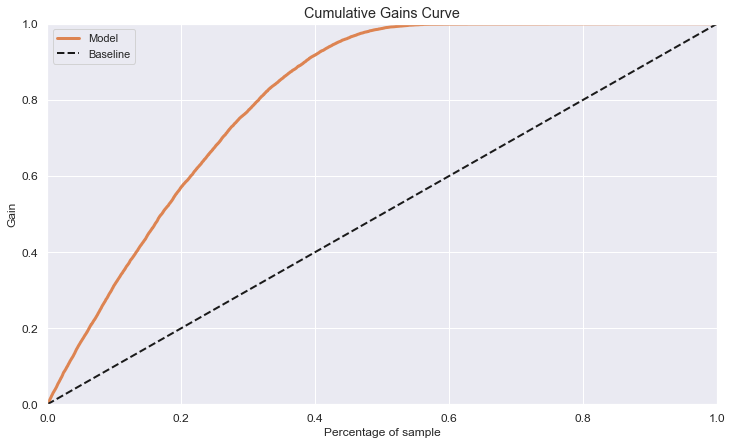

In [326]:
ax = skplt.metrics.plot_cumulative_gain(y_val, yhat_xgb, figsize=(12,7))
ax.lines[0].remove()
ax.legend().set_visible(False) 
ax.legend().get_texts()[0].set_text("Model")
plt.show()

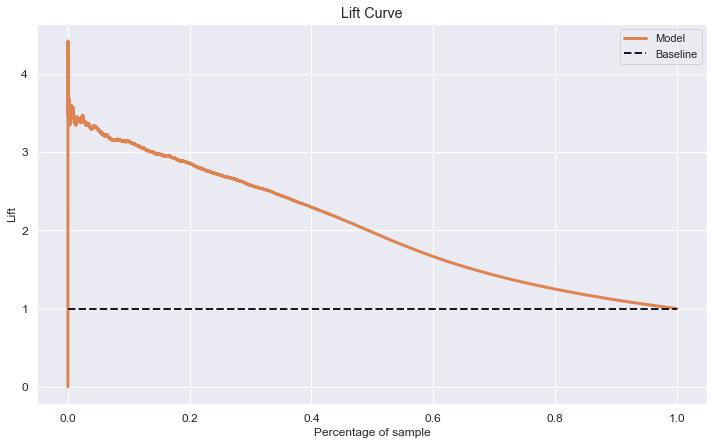

In [327]:
ax = skplt.metrics.plot_lift_curve(y_val, yhat_xgb, figsize=(12,7))
ax.lines[0].remove()
ax.legend().set_visible(False) 
ax.legend().get_texts()[0].set_text("Model")
plt.show()

## 9.2. Business Performance

### Questions

Qual a porcentagem de clientes interessados em adquirir um seguro de automóvel, o time de vendas conseguirá contatar fazendo 20.000 ligações?

In [328]:
n = 20000
inter_at_k = ml_score_at_k('XGB Classifier', df7, yhat_xgb, n)['recall_at_k'].values[0]

print(f'Numbers os contacts: {n} ({n/len(df7):.2%})')
print(f'Will impact {inter_at_k:.2%} of interested customers')

Numbers os contacts: 20000 (26.24%)
Will impact 70.27% of interested customers


E se a capacidade do time de vendas aumentar para 40.000 ligações, qual a porcentagem de clientes interessados em adquirir um seguro de automóvel o time de vendas conseguirá contatar?

In [329]:
n = 40000
inter_at_k = ml_score_at_k('XGB Classifier', df7, yhat_xgb, n)['recall_at_k'].values[0]

print(f'Numbers os contact: {n} ({n/len(df7):.2%})')
print(f'Will impact {inter_at_k:.2%} of interested customers')

Numbers os contact: 40000 (52.48%)
Will impact 99.33% of interested customers


Quantas ligações o time de vendas precisa fazer para contatar 80% dos clientes interessados em adquirir um seguro de automóvel?

In [330]:
df09['recall_at_k'] = df09['response'].cumsum() / df09['response'].sum()

impact = 0.8
n = df09.loc[df09['recall_at_k'] >= impact, 'position'].values[0]
 
inter_at_k = ml_score_at_k('XGB Classifier', df7, yhat_xgb, n)['recall_at_k'].values[0]

print(f'Numbers os contact: {n} ({n/len(df7):.2%})')
print(f'Will impact {inter_at_k:.2%} of interested customers')

Numbers os contact: 24045 (31.55%)
Will impact 80.01% of interested customers


## 9.3. Total Performance

In [331]:
# cost per contact --> 100
cost = 100
# revenue per contact --> 1000
revenue = 2000
# probability of response = 1 really buy --> 50%
df09['acumulated_revenue'] = df09['response'].apply(lambda x: x*revenue*random.choice([0,1])).cumsum()
df09['acumulated_cost'] = df09['position'] * cost
df09['gain'] = df09['acumulated_revenue'] - df09['acumulated_cost']

Assumindo:
1. Custo por contato = 100
2. Receita do cliente = 2000
3. Probabilidade do cliente que respondeu estar interessado realmente comprar = 50%

In [333]:
max_value_gain = df09[df09['gain'] == df09['gain'].max()].index[0]

fig = px.line(df09, x=df09.index, y=['acumulated_revenue', 'acumulated_cost', 'gain'])

fig.add_vline(x=max_value_gain, line_width=3, line_dash="dash", line_color="green", 
              annotation_text="max_gain", annotation_position="left")

fig.update_layout(width=900, height=450)

fig.add_vrect(x0=max_value_gain-2000, x1=max_value_gain+2000, 
              fillcolor='green', opacity=0.25, line_width=0)

print(f"\nMax Gain Value: ${df09.loc[max_value_gain, 'gain']:,.2f}\n")
print(f"Achive max gain contacting {(max_value_gain+1)/len(df09):.2%} of my database")

fig.show()


Max Gain Value: $5,543,700.00

Achive max gain contacting 44.03% of my database


# 10.0. PASSO 10 - DEPLOY MODEL

## 10.1. Retrain the model

In [163]:
# model
xgb_model = xgb.XGBClassifier(random_state=99,
                              use_label_encoder=False, 
                              eval_metric='auc', 
                              colsample_bytree=best_hyperparams['colsample_bytree'],
                              gamma=best_hyperparams['gamma'],
                              max_depth=int(best_hyperparams['max_depth']),
                              min_child_weight=best_hyperparams['min_child_weight'],
                              reg_alpha=best_hyperparams['reg_alpha'],
                              reg_lambda=best_hyperparams['reg_lambda'],
                              scale_pos_weight=best_hyperparams['scale_pos_weight'],
                              n_estimators=300
                             )
# preparation
my_data_preparation = DataPrepatarion(df4)

my_data_preparation.normalization()
my_data_preparation.rescaling()
my_data_preparation.encoding()

# dump parameters
my_data_preparation.dump_transformers()

# return data
train_data = my_data_preparation.get_train_data()

# split train
x_train = train_data.drop(columns=['response']).copy()
y_train = train_data['response'].copy()

# training
xgb_model.fit(x_train, y_train)

pickle.dump(xgb_model, open('../models/xgb_model_retrain.pkl', 'wb'))

## 10.2. Classe InsuranceCrossSell

In [ ]:
import pickle 
import pandas as pd


class InsuranceCrossSell(object):
    
    def __init__(self):
        self.rs_anual_premium = pickle.load(open('../parameters/rs_anual_premium.pkl', 'rb'))
        self.rs_age = pickle.load(open('../parameters/rs_age.pkl', 'rb'))
        self.minmax_vintage = pickle.load(open('../parameters/minmax_vintage.pkl', 'rb'))
        self.encoder_region_code = pickle.load(open('../parameters/encoder_region_code.pkl', 'rb'))
        self.encoder_policy_sales_channel = pickle.load(open('../parameters/encoder_policy_sales_channel.pkl', 'rb'))
        self.encoder_vehicle_age = pickle.load(open('../parameters/encoder_vehicle_age.pkl', 'rb'))
                                        
    def data_cleaning(self, data1):
        data1.columns = data1.columns.to_series().str.lower()
        
        return data1
    
    
    def feature_engineering(self, data2):
        # changing vehicle_damage --> 1 == yes //// 0 == no
        data2['vehicle_damage'] = data2['vehicle_damage'].apply(lambda x: 1 if x == 'Yes' else 0)

        # vehicle_age
        data2['vehicle_age'] = data2['vehicle_age'].apply(lambda x: 'over_2_years' if x == '> 2 Years' 
                                                      else '1_to_2_years' if x == '1-2 Year' 
                                                      else 'under_1_year')
        
        return data2
        
        
    def data_preparation(self, data3):
        
        # annual_premium
        data3['annual_premium'] = self.rs_anual_premium.transform(data3[['annual_premium']].values)

        # age
        data3['age'] = self.rs_age.transform(data3[['age']].values)

        # vintage
        data3['vintage'] = self.minmax_vintage.transform(data3[['vintage']].values)

        # gender
        data3['gender'] = data3['gender'].apply(lambda x: 1 if x == 'Male' 
                                                      else 0)

        # region_code
        data3['region_code'] = self.encoder_region_code.transform(data3['region_code'].astype(str))


        # policy_sales_channel
        data3['policy_sales_channel'] = self.encoder_policy_sales_channel.transform(data3['policy_sales_channel'].astype(str))


        # vehicle_age
        vehicle_age_encoded = self.encoder_vehicle_age.transform(data3['vehicle_age'])
        data3[self.encoder_vehicle_age.get_feature_names()] =  vehicle_age_encoded.values
        data3 = data3.drop(columns=['vehicle_age'])
        
        columns_selected = ['vintage', 'annual_premium', 'age', 
                    'region_code', 'policy_sales_channel', 
                    'vehicle_damage', 'previously_insured']


        data3 = data3[columns_selected]

        
        return data3
    
    def get_prediction(self, model, prepared_data, original_data):
        
        # predictions
        rank = model.predict_proba(prepared_data)
        
        score_of_1 = [r[1] for r in rank]
        
        original_data['score'] = score_of_1
        
        return original_data.to_json(orient='records', date_format='iso')
        

## 10.3. Handler.py

In [ ]:
### TODO --> 

In [ ]:
from flask import Flask, request,Response
from insurance.InsuranceCrossSell import InsuranceCrossSell
import pickle
import pandas as pd

# loading model
model = pickle.load(open('../models/xgb_model.pkl', 'rb'))

# api
app = Flask(__name__)

@app.route('/')
def test_status():
    return {'status': 'ok'}

@app.route('/insurance/clients/rank', methods=['POST'])
def insurance_rank():
    test_json = request.get_json()
    
    if test_json:
        if isinstance(test_json, dict): # unique line
            test_raw = pd.DataFrame(test_json, index=[0])
        else: # multiple lines
            test_raw = pd.DataFrame(test_json, columns=test_json[0].keys())
            
        # Instantiate Rossmanclass
        pipeline = InsuranceCrossSell()

        df_0 = test_raw.copy()
        # data cleaning
        df_1 = pipeline.data_cleaning(test_raw)
        
        # feature engineering
        df_2 = pipeline.feature_engineering(df_1)
        # data prepatarion
        df_3 = pipeline.data_preparation(df_2)
        # predicition
        df_response = pipeline.get_prediction(model, df_3, test_raw)
        
        return df_response
        
    else:
        return Response('{No Data}', status=200, mimetype='application/json')
    
if __name__=='__main__':
    app.run('0.0.0.0')

## 10.4. API Tester

In [89]:
df_test = pd.read_csv('../datasets/test.csv')
df_test.columns = df_test.columns.to_series().str.lower()
df_test.head()

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage
0,381110,Male,25,1,11.0,1,< 1 Year,No,35786.0,152.0,53
1,381111,Male,40,1,28.0,0,1-2 Year,Yes,33762.0,7.0,111
2,381112,Male,47,1,28.0,0,1-2 Year,Yes,40050.0,124.0,199
3,381113,Male,24,1,27.0,1,< 1 Year,Yes,37356.0,152.0,187
4,381114,Male,27,1,28.0,1,< 1 Year,No,59097.0,152.0,297


In [67]:
# convert DataFrame to json
data_test = p_enviar.to_json(orient='records')

# API call
#url = 'http://192.168.1.10:5000/insurance/clients/rank'
url = 'https://insurance-ranking-clients.herokuapp.com/insurance/clients/rank'
header = {'Content-type': 'application/json'}
data = data_test

r = requests.post(url, data=data, headers=header)
print(f'Status Code {r.status_code}')

Status Code 200


In [68]:
d1 = pd.DataFrame(r.json())

In [79]:
d1.head()

,id,gender,age,region_code,policy_sales_channel,previously_insured,annual_premium,vintage,driving_license,vehicle_age,vehicle_damage,new_id,vehicle_age_under_1_year,vehicle_age_1_to_2_years,vehicle_age_over_2_years,ranking
0,356550,0,1.041667,0.186852,0.199686,0,1.385179,0.003460,1,1_to_2_years,1,330633,0,1,0,0.331200
1,197058,0,0.875000,0.127782,0.296643,0,-0.868100,0.747405,1,1_to_2_years,1,215543,0,1,0,0.350178
2,66260,0,0.250000,0.091949,0.265549,0,-1.933950,0.619377,1,1_to_2_years,1,103853,0,1,0,0.237369
3,9061,0,-0.083333,0.186852,0.176795,0,0.430655,0.892734,1,1_to_2_years,1,96631,0,1,0,0.425803
4,183343,1,-0.458333,0.080372,0.028633,0,-0.219322,0.854671,1,under_1_year,0,309092,1,0,0,0.025394


In [93]:
df_send = d1[['id', 'ranking']]
df_send.columns=['id', 'Response']

In [95]:
df_send.to_csv('send_file.csv', index=False)

In [ ]:
ml_score_at_k('Teste', d1, d1['ranking'], int(len(d1['ranking'])*0.3))